In [15]:
import numpy as np
import pandas as pd
from itertools import product
import os
from tqdm import tqdm
import networkx as nx
import matplotlib.pyplot as plt

from pyproj import CRS, Transformer
import cartopy.crs as ccrs
import cartopy.io.img_tiles as cimgt

import copy

#### Locate folder and load file

In [2]:
#source = '/media/Data_storage/Mobilcell/TimeIntervalGraphs/'
source = '/home/abiricz/Projects/Mobilcell/getting_started/'

In [3]:
!pwd

/home/abiricz/Projects/Mobilcell/getting_started


In [17]:
files = np.array( sorted( os.listdir(source) ) )
files[:5]

array(['.ipynb_checkpoints', 'AdatTisztitasMentes.jar',
       'Data_exploration_visualization.ipynb',
       'DayEvent_postprocessing.ipynb', 'EDA.ipynb'], dtype='<U72')

In [9]:
dates = np.unique( np.array( [ i.split('_')[1] for i in files ] ) )
dates[:5]

IndexError: list index out of range

In [5]:
day_idx = np.sort( np.unique( np.array( [ i.split('_')[2] for i in files ] ) ).astype(int) )
day_idx

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47])

In [4]:
#loaded = np.load( source+'graph_20181201_15_minutes-450-480.npz' )
#loaded = np.load( source+'graph_20181201_20_minutes-600-630.npz' )

loaded = np.load( source+'graph_20190409_15_minutes-450-480.npz' )
loaded = np.load( source+'graph_20190409_20_minutes-600-630.npz' )

In [5]:
list( loaded.keys() )

['data_edge_index', 'data_edge_attr', 'data_x']

In [6]:
edge_list = loaded['data_edge_index']
edge_attr = loaded['data_edge_attr']
node_attr = loaded['data_x']
edge_list.shape, edge_attr.shape, node_attr.shape

((2, 139899), (139899, 1), (43376, 2))

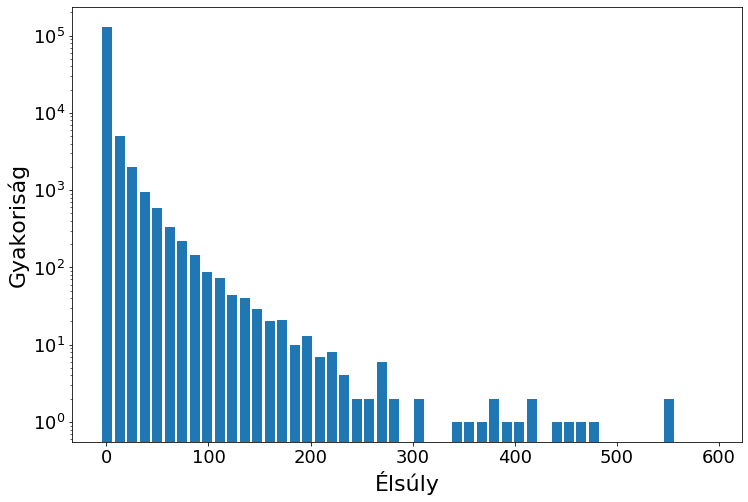

In [7]:
# https://stackoverflow.com/questions/37170511/scaled-logarithmic-binning-in-python
# log-scaled bins
plt.figure( figsize=(12,8) )
#bins = np.logspace(0, 1.5, 100)
bins = np.linspace(1, 600, 50)
widths = (bins[1:] - bins[:-1])

# Calculate histogram
to_hist = edge_attr
hist = np.histogram( to_hist, bins=bins)
# normalize by bin width
hist_norm = hist[0]#/widths

# plot it!
plt.bar(bins[:-1], hist_norm, 0.8*widths)
#plt.xscale('log')
plt.yscale('log')

plt.ylabel('Gyakoriság', fontsize=22)
plt.xlabel('Élsúly', fontsize=22)
plt.tick_params( labelsize=18 )
plt.savefig('terkep_elsuly_1nap_Mo.png', dpi=100)

In [8]:
np.sort(np.unique( edge_list.flatten() ))

array([    0,     1,     2, ..., 14582, 14583, 14584])

In [9]:
!ls ../cellphone/Data/

event_datetime.csv  fixed_tower_locations.csv


In [10]:
tower_df = pd.read_csv( '/media/Data_storage/Mobilcell/DayPolygonData/fixed_merged_tower_locations.csv' )
tower_df.head()

,original_id,tower_id,mean_x,mean_y
0,71892,9058,250859,557285
1,72307,9059,243343,558377
2,72922,9060,247254,549716
3,73325,9061,248646,551068
4,140903,5295,273888,796498


In [11]:
sort_idx = np.argsort( tower_df.tower_id.values )
tower_df = tower_df.iloc[ sort_idx ]
tower_df.reset_index(inplace=True)
tower_df.head()

,index,original_id,tower_id,mean_x,mean_y
0,11770,42751908,0,239320,650532
1,12921,62654186,0,239320,650532
2,5935,1915243,0,239320,650532
3,5936,1915251,0,239320,650532
4,25972,193789412,0,239320,650532


In [16]:
coords = np.unique( tower_df.iloc[:,2:], axis=0 )[:,1:]

In [17]:
(edge_list[0,:] < edge_list[1,:]).sum(), edge_list.shape

(139899, (2, 139899))

In [18]:
 np.sum( edge_attr.flatten() )

649757

In [19]:
# create adjacency matrix and make graph undirected
adj_mat = np.zeros( (coords.shape[0], coords.shape[0]), dtype=np.uint32 )
adj_mat[ edge_list[0,:], edge_list[1,:] ] = edge_attr[:,0]

In [20]:
G = nx.from_numpy_matrix(adj_mat)
len( G.nodes() ), len( G.edges() )

(14585, 139899)

In [21]:
crs_eov = CRS.from_epsg("23700")
crs_lonlat = CRS.from_epsg("4326")
#crs_eov, crs_lonlat
transformer = Transformer.from_crs(crs_eov, crs_lonlat)

In [22]:
x_, y_ = transformer.transform( xx=coords[:,1],
                                yy=coords[:,0]  )
x_.shape, y_.shape

((14585,), (14585,))

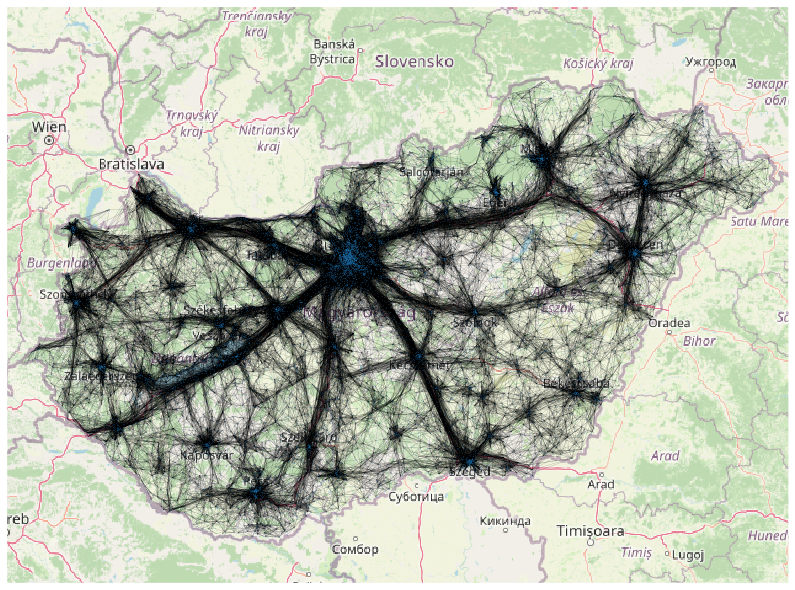

In [23]:
# Plot graph on map
request = cimgt.OSM() # openstreetmap or google map background

# figure settings
fig, ax = plt.subplots(figsize=(14,20), subplot_kw=dict(projection=request.crs))
extent = [16, 23, 45.5, 49]  # (xmin, xmax, ymin, ymax) # select ROI
ax.set_extent(extent)
ax.add_image(request, 7) # 7 is a layer num, higher means more detail

graph_lon = y_
graph_lat = x_

pos_lonlat_nx = { j : ( graph_lon[i], 
                     graph_lat[i] ) for i, j in enumerate(list(G.nodes)) }

# do coordinate conversion of (x,y), Geodetic is the default in set_extent()
pos_geo = ax.projection.transform_points( ccrs.Geodetic(), 
                                        graph_lon, graph_lat)

pos_geo_nx = { j : ( pos_geo[i,0], 
                     pos_geo[i,1] ) for i, j in enumerate(list(G.nodes)) }
nx.draw(G, pos=pos_geo_nx, node_size=0.01, alpha=1., width=0.1)
#plt.savefig('Tower_overlap_graph_20181201.png')

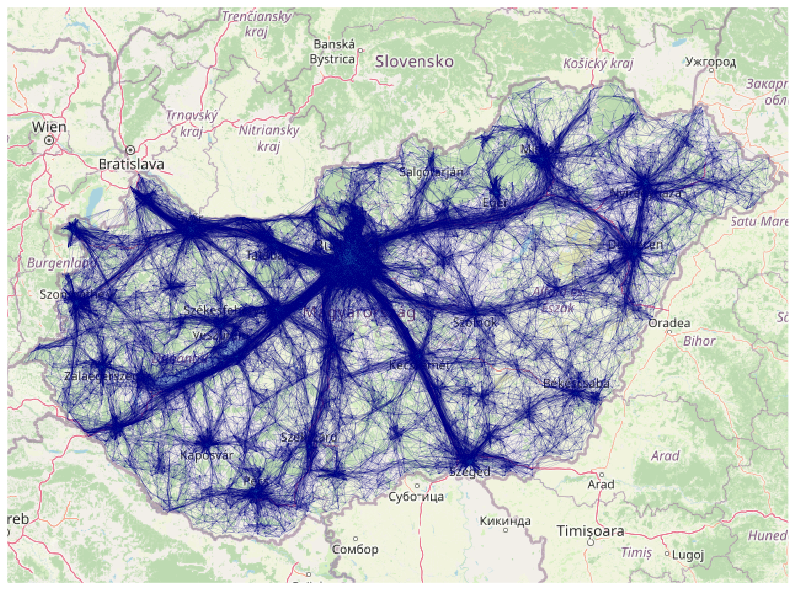

In [24]:
# Plot graph on map
request = cimgt.OSM() # openstreetmap or google map background

# figure settings
fig, ax = plt.subplots(figsize=(14,20), subplot_kw=dict(projection=request.crs))
extent = [16, 23, 45.5, 49]  # (xmin, xmax, ymin, ymax) # select ROI
ax.set_extent(extent)
ax.add_image(request, 7) # 7 is a layer num, higher means more detail

graph_lon = y_
graph_lat = x_

pos_lonlat_nx = { j : ( graph_lon[i], 
                     graph_lat[i] ) for i, j in enumerate(list(G.nodes)) }

# do coordinate conversion of (x,y), Geodetic is the default in set_extent()
pos_geo = ax.projection.transform_points( ccrs.Geodetic(), 
                                        graph_lon, graph_lat)

pos_geo_nx = { j : ( pos_geo[i,0], 
                     pos_geo[i,1] ) for i, j in enumerate(list(G.nodes)) }

nx.draw( G, pos=pos_geo_nx, node_size=0.001, 
       alpha=1., width=0.1, 
       edge_color=edge_attr.flatten(), edge_cmap=plt.cm.jet )
#plt.savefig('Tower_overlap_graph_20181201.png')

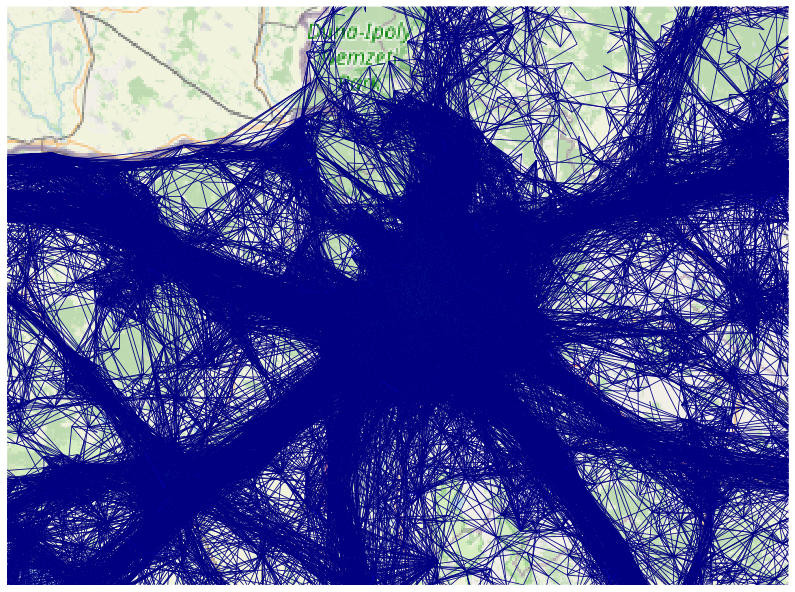

In [25]:
# Plot graph on map
request = cimgt.OSM() # openstreetmap or google map background

# figure settings
fig, ax = plt.subplots(figsize=(14,20), subplot_kw=dict(projection=request.crs))
extent = [18, 20, 47, 48]  # (xmin, xmax, ymin, ymax) # select ROI
ax.set_extent(extent)
ax.add_image(request, 8) # 7 is a layer num, higher means more detail

graph_lon = y_
graph_lat = x_

pos_lonlat_nx = { j : ( graph_lon[i], 
                     graph_lat[i] ) for i, j in enumerate(list(G.nodes)) }

# do coordinate conversion of (x,y), Geodetic is the default in set_extent()
pos_geo = ax.projection.transform_points( ccrs.Geodetic(), 
                                        graph_lon, graph_lat)

pos_geo_nx = { j : ( pos_geo[i,0], 
                     pos_geo[i,1] ) for i, j in enumerate(list(G.nodes)) }

nx.draw( G, pos=pos_geo_nx, node_size=0.001, 
       alpha=1., width=0.8, 
       edge_color=edge_attr.flatten(), edge_cmap=plt.cm.jet )
#plt.savefig('Tower_overlap_graph_20181201.png')

In [26]:
adj_mat_restricted = copy.deepcopy( adj_mat.flatten() )
to_zero = adj_mat_restricted < 3
adj_mat_restricted[ to_zero ] = 0
adj_mat_restricted = adj_mat_restricted.reshape( coords.shape[0], coords.shape[0] )
adj_mat_restricted.shape

(14585, 14585)

In [27]:
edge_attr_restricted = copy.deepcopy( edge_attr )
edge_attr_restricted = edge_attr_restricted[ edge_attr_restricted > 2 ]
edge_attr_restricted.shape

(43576,)

In [28]:
G_restricted = nx.from_numpy_matrix(adj_mat_restricted)
len( G_restricted.nodes() ), len( G_restricted.edges() )

(14585, 43576)

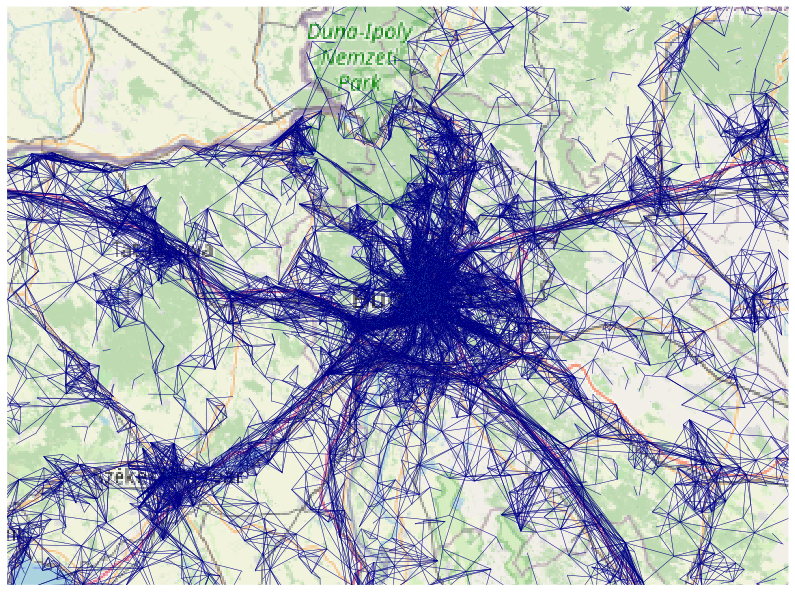

In [29]:
# Plot graph on map
request = cimgt.OSM() # openstreetmap or google map background

# figure settings
fig, ax = plt.subplots(figsize=(14,20), subplot_kw=dict(projection=request.crs))
extent = [18, 20, 47, 48]  # (xmin, xmax, ymin, ymax) # select ROI
ax.set_extent(extent)
ax.add_image(request, 8) # 7 is a layer num, higher means more detail

graph_lon = y_
graph_lat = x_

pos_lonlat_nx = { j : ( graph_lon[i], 
                     graph_lat[i] ) for i, j in enumerate(list(G.nodes)) }

# do coordinate conversion of (x,y), Geodetic is the default in set_extent()
pos_geo = ax.projection.transform_points( ccrs.Geodetic(), 
                                        graph_lon, graph_lat)

pos_geo_nx = { j : ( pos_geo[i,0], 
                     pos_geo[i,1] ) for i, j in enumerate(list(G.nodes)) }

nx.draw( G_restricted, pos=pos_geo_nx, node_size=0.01, 
       alpha=1., width=0.5, 
       edge_color=edge_attr_restricted.flatten(), edge_cmap=plt.cm.jet )
#plt.savefig('Tower_overlap_graph_20181201.png')

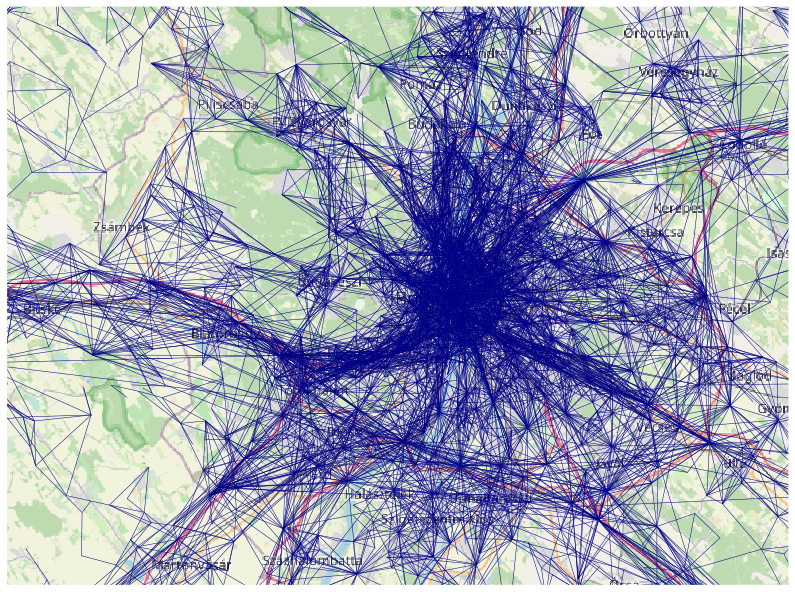

In [30]:
# Plot graph on map
request = cimgt.OSM() # openstreetmap or google map background

# figure settings
fig, ax = plt.subplots(figsize=(14,20), subplot_kw=dict(projection=request.crs))
extent = [18.6, 19.4, 47.3, 47.7]  # (xmin, xmax, ymin, ymax) # select ROI
ax.set_extent(extent)
ax.add_image(request, 10) # 7 is a layer num, higher means more detail

graph_lon = y_
graph_lat = x_

pos_lonlat_nx = { j : ( graph_lon[i], 
                     graph_lat[i] ) for i, j in enumerate(list(G.nodes)) }

# do coordinate conversion of (x,y), Geodetic is the default in set_extent()
pos_geo = ax.projection.transform_points( ccrs.Geodetic(), 
                                        graph_lon, graph_lat)

pos_geo_nx = { j : ( pos_geo[i,0], 
                     pos_geo[i,1] ) for i, j in enumerate(list(G.nodes)) }

nx.draw( G_restricted, pos=pos_geo_nx, node_size=0.01, 
       alpha=1., width=0.5, 
       edge_color=edge_attr_restricted.flatten(), edge_cmap=plt.cm.jet )
#plt.savefig('Tower_overlap_graph_20181201.png')

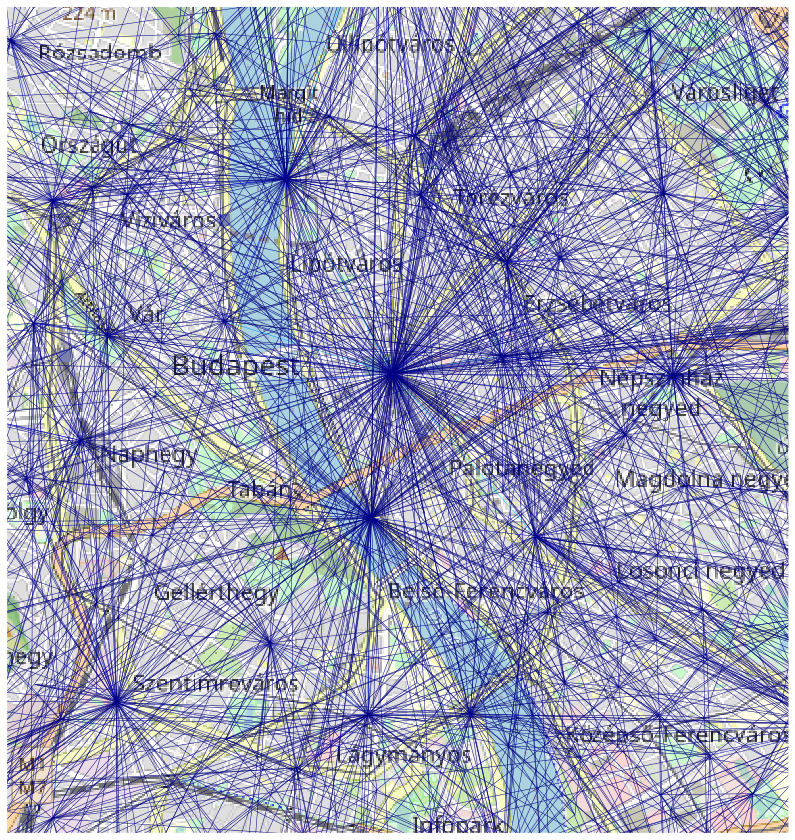

In [31]:
# Plot graph on map
request = cimgt.OSM() # openstreetmap or google map background

# figure settings
fig, ax = plt.subplots(figsize=(14,20), subplot_kw=dict(projection=request.crs))
extent = [19.02, 19.09, 47.47, 47.52]  # (xmin, xmax, ymin, ymax) # select ROI
ax.set_extent(extent)
ax.add_image(request, 13) # 7 is a layer num, higher means more detail

graph_lon = y_
graph_lat = x_

pos_lonlat_nx = { j : ( graph_lon[i], 
                     graph_lat[i] ) for i, j in enumerate(list(G.nodes)) }

# do coordinate conversion of (x,y), Geodetic is the default in set_extent()
pos_geo = ax.projection.transform_points( ccrs.Geodetic(), 
                                        graph_lon, graph_lat)

pos_geo_nx = { j : ( pos_geo[i,0], 
                     pos_geo[i,1] ) for i, j in enumerate(list(G.nodes)) }

nx.draw( G_restricted, pos=pos_geo_nx, node_size=0.01, 
       alpha=1., width=0.5, 
       edge_color=edge_attr_restricted.flatten(), edge_cmap=plt.cm.jet )
#plt.savefig('Tower_overlap_graph_20181201.png')

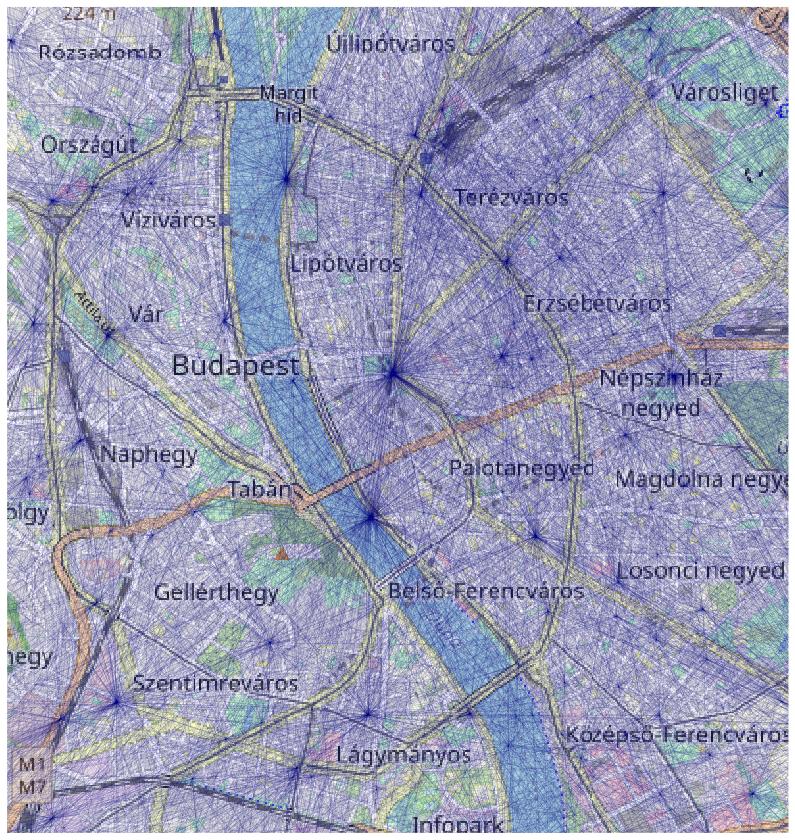

In [32]:
# Plot graph on map
request = cimgt.OSM() # openstreetmap or google map background

# figure settings
fig, ax = plt.subplots(figsize=(14,20), subplot_kw=dict(projection=request.crs))
extent = [19.02, 19.09, 47.47, 47.52]  # (xmin, xmax, ymin, ymax) # select ROI
ax.set_extent(extent)
ax.add_image(request, 13) # 7 is a layer num, higher means more detail

graph_lon = y_
graph_lat = x_

pos_lonlat_nx = { j : ( graph_lon[i], 
                     graph_lat[i] ) for i, j in enumerate(list(G.nodes)) }

# do coordinate conversion of (x,y), Geodetic is the default in set_extent()
pos_geo = ax.projection.transform_points( ccrs.Geodetic(), 
                                        graph_lon, graph_lat)

pos_geo_nx = { j : ( pos_geo[i,0], 
                     pos_geo[i,1] ) for i, j in enumerate(list(G.nodes)) }

nx.draw( G, pos=pos_geo_nx, node_size=0.01, 
       alpha=1., width=0.075, 
       edge_color=edge_attr.flatten(), edge_cmap=plt.cm.jet )
#plt.savefig('Tower_overlap_graph_20181201.png')

In [33]:
x_filt = np.logical_and( x_ > 47.47, x_ < 47.52 )
x_filt = np.logical_and( y_ > 19.02, x_filt )
xy_filt = np.logical_and( y_ < 19.09, x_filt )

In [34]:
np.sum( adj_mat[xy_filt] )

35521

In [30]:
np.sum( adj_mat[xy_filt] )

24762

In [31]:
np.sum(adj_mat)

543778

In [32]:
adj_mat[xy_filt].flatten()

array([0, 0, 0, ..., 0, 0, 0], dtype=uint32)

array([ 0.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12.,
       13., 14., 15., 16., 17., 18., 19., 20., 21., 22., 23., 24., 25.,
       26., 27., 28., 29., 30., 31., 32., 33., 34., 35.])

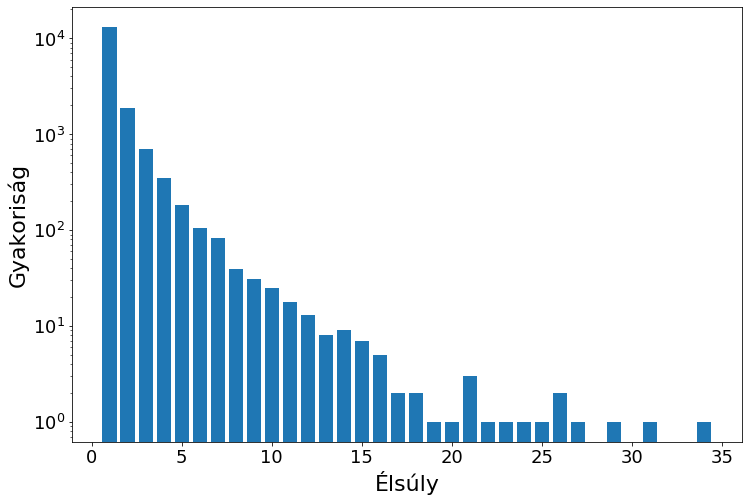

In [51]:
# https://stackoverflow.com/questions/37170511/scaled-logarithmic-binning-in-python
# log-scaled bins
plt.figure( figsize=(12,8) )
#bins = np.logspace(0, 1.5, 100)
bins = np.linspace(1, 35, 35)
widths = (bins[1:] - bins[:-1])

# Calculate histogram
to_hist = adj_mat[xy_filt].flatten()
to_hist = to_hist[ to_hist > 0 ]
hist = np.histogram( to_hist, bins=bins)
# normalize by bin width
hist_norm = hist[0]#/widths

# plot it!
plt.bar(bins[:-1], hist_norm)# widths)
#plt.xscale('log')
plt.yscale('log')

plt.ylabel('Gyakoriság', fontsize=22)
plt.xlabel('Élsúly', fontsize=22)
plt.tick_params( labelsize=18 )
plt.savefig('terkep_elsuly_30min_Bp.png', dpi=100)

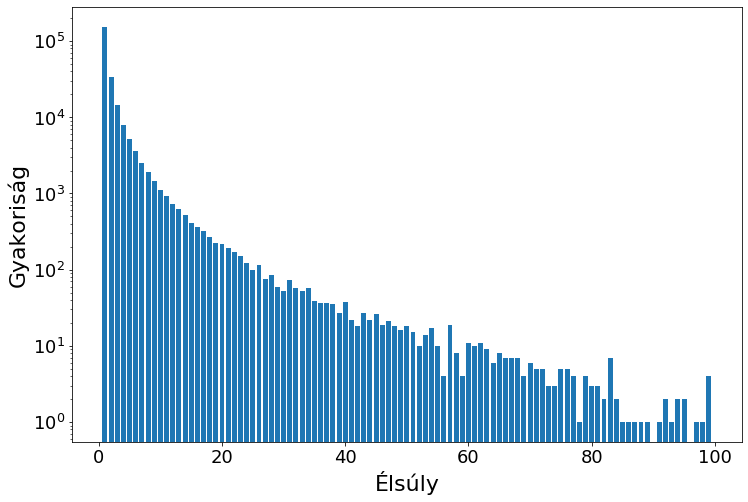

In [54]:
# https://stackoverflow.com/questions/37170511/scaled-logarithmic-binning-in-python
# log-scaled bins
plt.figure( figsize=(12,8) )
#bins = np.logspace(0, 1.5, 100)
bins = np.linspace(1, 100, 100)
widths = (bins[1:] - bins[:-1])

# Calculate histogram
to_hist = adj_mat.flatten()
to_hist = to_hist[ to_hist > 0 ]
hist = np.histogram( to_hist, bins=bins)
# normalize by bin width
hist_norm = hist[0]#/widths

# plot it!
plt.bar(bins[:-1], hist_norm)# widths)
#plt.xscale('log')
plt.yscale('log')

plt.ylabel('Gyakoriság', fontsize=22)
plt.xlabel('Élsúly', fontsize=22)
plt.tick_params( labelsize=18 )
plt.savefig('terkep_elsuly_30min_Mo.png', dpi=100)

In [20]:
day_data = np.load('/media/Data_storage/Mobilcell/DayEventData/output_daily-events-data_20190409.npy')
day_data.shape

(20386117, 11)

In [29]:
# get multiple movements as weights
uq, counts = np.unique( np.concatenate( ( day_data[:,-2:], 
                             np.ones(day_data.shape[0]).reshape(-1,1) ), 
                          axis=1 ).astype(np.uint16), 
          return_counts=True, axis=0 )

# create edgelist
V = np.concatenate( ( uq[:,:2], counts.reshape(-1,1) ), axis=1 )

# create adjacency matrix and make graph undirected
adj_mat_day = np.zeros( (43384, 43384), dtype=np.uint32 )
adj_mat_day[ V[:,0], V[:,1] ] = V[:,2]
adj_mat_day = adj_mat_day# + adj_mat_day.T

# get back the edgelist
idxs = np.argwhere( adj_mat_day )
filt = idxs[:,0] < idxs[:,1]
V_new = np.concatenate( (idxs[filt], adj_mat_day[ idxs[:,0][filt], idxs[:,1][filt] ].reshape(-1,1) ), axis=1 )

data_edge_index = V_new[:,:2].T
data_edge_attr = V_new[:,-1].reshape(-1,1)

In [22]:
G_day = nx.from_numpy_matrix(adj_mat_day)
len( G_day.nodes() ), len( G_day.edges() )

(43384, 2397555)

In [23]:
adj_mat_day_restricted = copy.deepcopy( adj_mat_day.flatten() )
to_zero = adj_mat_day_restricted < 10
adj_mat_day_restricted[ to_zero ] = 0
adj_mat_day_restricted = adj_mat_day_restricted.reshape( 43384, 43384 )
adj_mat_day_restricted.shape

(43384, 43384)

In [27]:
G_day_restricted = nx.from_numpy_matrix(adj_mat_day_restricted)
len( G_day_restricted.nodes() ), len( G_day_restricted.edges() )

(43384, 281180)

In [30]:
x_filt = np.logical_and( x_ > 47.47, x_ < 47.52 )
x_filt = np.logical_and( y_ > 19.02, x_filt )
xy_filt = np.logical_and( y_ < 19.09, x_filt )

In [31]:
np.sum( adj_mat_day[xy_filt] )

1216938

In [32]:
np.sum( adj_mat_day )

20386117

In [28]:
adj_mat_day

array([[  0,  80,  69, ...,   0,   0,   0],
       [ 80,   0, 108, ...,   0,   0,   0],
       [ 69, 108,   0, ...,   0,   0,   0],
       ...,
       [  0,   0,   0, ...,   0,   2,   5],
       [  0,   0,   0, ...,   2,   0,   5],
       [  0,   0,   0, ...,   5,   5,   0]], dtype=uint32)

In [24]:
data_edge_attr_restricted = copy.deepcopy( data_edge_attr )
data_edge_attr_restricted = data_edge_attr_restricted[ data_edge_attr_restricted > 9 ]
data_edge_attr_restricted.shape

(281180,)

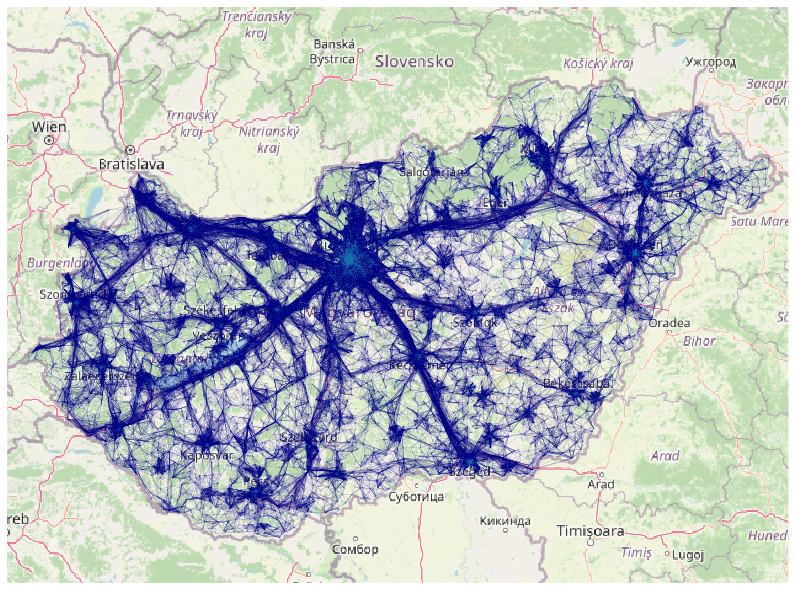

In [29]:
# Plot graph on map
request = cimgt.OSM() # openstreetmap or google map background

# figure settings
fig, ax = plt.subplots(figsize=(14,20), subplot_kw=dict(projection=request.crs))
extent = [16, 23, 45.5, 49]  # (xmin, xmax, ymin, ymax) # select ROI
ax.set_extent(extent)
ax.add_image(request, 7) # 7 is a layer num, higher means more detail

graph_lon = y_
graph_lat = x_

pos_lonlat_nx = { j : ( graph_lon[i], 
                     graph_lat[i] ) for i, j in enumerate(list(G.nodes)) }

# do coordinate conversion of (x,y), Geodetic is the default in set_extent()
pos_geo = ax.projection.transform_points( ccrs.Geodetic(), 
                                        graph_lon, graph_lat)

pos_geo_nx = { j : ( pos_geo[i,0], 
                     pos_geo[i,1] ) for i, j in enumerate(list(G.nodes)) }

nx.draw( G_day_restricted, pos=pos_geo_nx, node_size=0.001, 
       alpha=1., width=0.1, 
       edge_color=data_edge_attr_restricted.flatten(), edge_cmap=plt.cm.jet )
#plt.savefig('Tower_overlap_graph_20181201.png')

In [39]:
coloring = np.log10(data_edge_attr_restricted) / np.log10(data_edge_attr_restricted.max())

In [40]:
coloring[:5]

array([0.49305423, 0.47641064, 0.40629108, 0.27959523, 0.26980493])

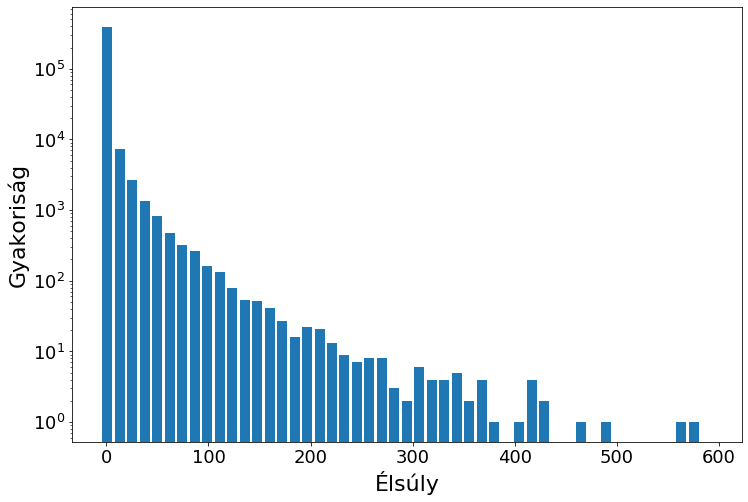

In [42]:
# https://stackoverflow.com/questions/37170511/scaled-logarithmic-binning-in-python
# log-scaled bins
plt.figure( figsize=(12,8) )
#bins = np.logspace(0, 1.5, 100)
bins = np.linspace(1, 600, 50)
widths = (bins[1:] - bins[:-1])

# Calculate histogram
to_hist = adj_mat_day[xy_filt].flatten()
to_hist = to_hist[ to_hist > 0 ]
hist = np.histogram( to_hist, bins=bins)
# normalize by bin width
hist_norm = hist[0]#/widths

# plot it!
plt.bar(bins[:-1], hist_norm, 0.8*widths)
#plt.xscale('log')
plt.yscale('log')

plt.ylabel('Gyakoriság', fontsize=22)
plt.xlabel('Élsúly', fontsize=22)
plt.tick_params( labelsize=18 )
plt.savefig('terkep_elsuly_1nap_Bp.png', dpi=100)

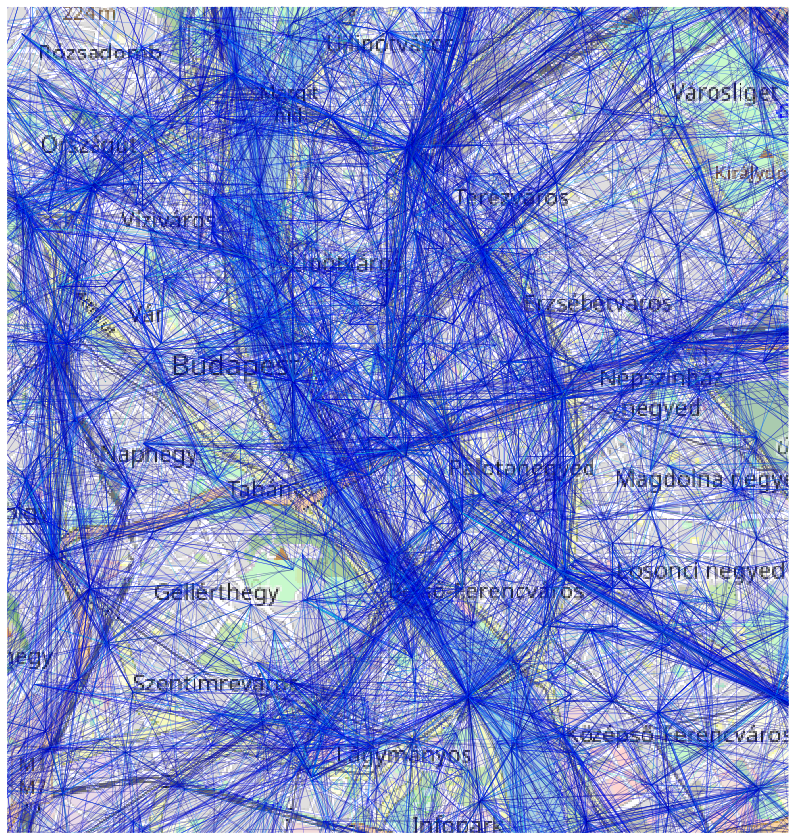

In [45]:
# Plot graph on map
request = cimgt.OSM() # openstreetmap or google map background

# figure settings
fig, ax = plt.subplots(figsize=(14,20), subplot_kw=dict(projection=request.crs))
extent = [19.02, 19.09, 47.47, 47.52]  # (xmin, xmax, ymin, ymax) # select ROI
ax.set_extent(extent)
ax.add_image(request, 13) # 7 is a layer num, higher means more detail

graph_lon = y_
graph_lat = x_

pos_lonlat_nx = { j : ( graph_lon[i], 
                     graph_lat[i] ) for i, j in enumerate(list(G.nodes)) }

# do coordinate conversion of (x,y), Geodetic is the default in set_extent()
pos_geo = ax.projection.transform_points( ccrs.Geodetic(), 
                                        graph_lon, graph_lat)

pos_geo_nx = { j : ( pos_geo[i,0], 
                     pos_geo[i,1] ) for i, j in enumerate(list(G.nodes)) }

nx.draw( G_day_restricted, pos=pos_geo_nx, node_size=0.01, width=0.5, alpha=0.5,
       edge_color=coloring, edge_cmap=plt.cm.jet )
#plt.savefig('Tower_overlap_graph_20181201.png')

### TODO:
- investigate polygon grid
- fix polygon grid somehow beyond days, towers should be at the same pos
- maybe do it in post proc phase with np.isclose and threshold
- check polygons for technology (2G, 3G, 4G), maybe embed data into multiple layers?


- check mobilecell data for different kind of events (data, sms, call)
- which is most problematic?


- can do great improvement:
    * match polygon grid with openstreetmap
    * movements should be along roads, trainlines, etc.
    * might be good to interpolate only events shorter that 60 minutes


- goal: 
    * same network node distribution, same positions, but different links
    * graph links evolving in time -> encoder embedding, LSTM or RNN to pred, then tranform back or look for link prediction algorithms

Some sources:

- https://github.com/facebookresearch/SEAL_OGB
- https://ogb.stanford.edu/docs/linkprop/#ogbl-ppa
- https://ogb.stanford.edu/docs/leader_linkprop/
